# Complete Dataframe (2008-2022)
- Graphs/Visualization
    1. Daily Stock Returns
    2. Cumulative Stock Returns
- Optimal Weights 
    1. Covariance Matrix
    2. Correlation Matrix
    3. Annual Returns
    4. Annual Standard Deviation
    5. Returns/Volatility Table
    6. Optimal Weights Calculations
- Calculate Historical Optimal Portfolio Return using Optimal Weights
    1. Historical Daily Returns for the Optimal Portfolio
    2. Historical Cumulative Returns for the Optimal Portfolio

In [1]:
# Import libraries
import numpy as np
import pandas as pd
from pandas_datareader import data
import plotly.express as px
import datetime
import plotly.graph_objects as go
import plotly.io as pio
from datetime import timedelta
from MCForecastTools import MCSimulation
from IPython.display import display

In [2]:
# Import variables 
%store -r stocks
%store -r benchmark
%store -r start_date
%store -r end_date
%store -r out_sample_days_held_back
%store -r theme
%store -r number_opt_porfolios
%store -r rf
%store -r number_simulation
%store -r years
%store -r init_investment
seed=42
np.random.seed(seed)
%store -r df
%store -r stock_returns

## Graphs/Visualization 

### 1. Daily Stock Returns

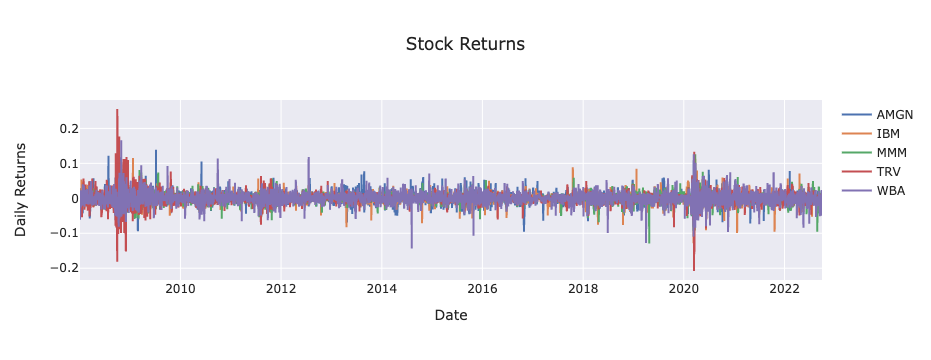

In [3]:
# Plot the returns for each stock
fig = go.Figure()

for stock, col in enumerate(stock_returns.columns.tolist()):
    fig.add_trace(
    go.Scatter(
        x=stock_returns.index,
        y=stock_returns[col],
        name=stocks[stock]
    ))
    
fig.update_layout(
    title={
        'text': "Stock Returns",
    },
    template=theme,
    xaxis=dict(autorange=True,
              title_text='Date'),
    yaxis=dict(autorange=True,
              title_text='Daily Returns')
)

fig.show()

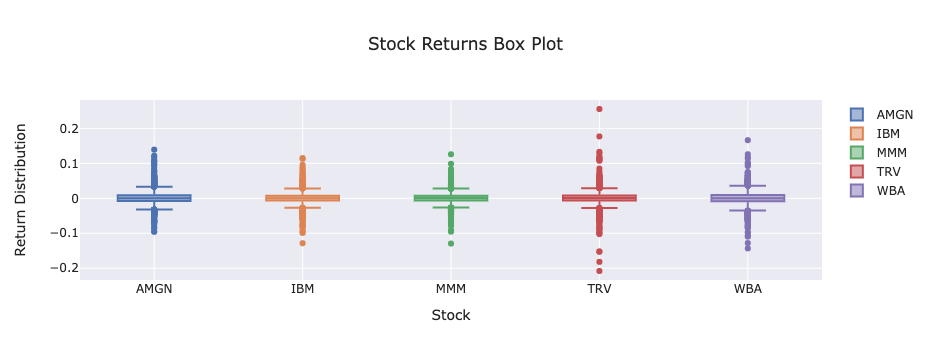

In [4]:
# Plot a Boxplot of each stocks returns
fig = go.Figure()

for stock, col in enumerate(stock_returns.columns.tolist()):
    fig.add_trace(
    go.Box(
        y=stock_returns[col],
        name=stocks[stock]
    ))


fig.update_layout(
    title={
        'text': "Stock Returns Box Plot",
    },
    template=theme,
    xaxis=dict(autorange=True,
              title_text='Stock'),
    yaxis=dict(autorange=True,
              title_text='Return Distribution')
)

fig.show()

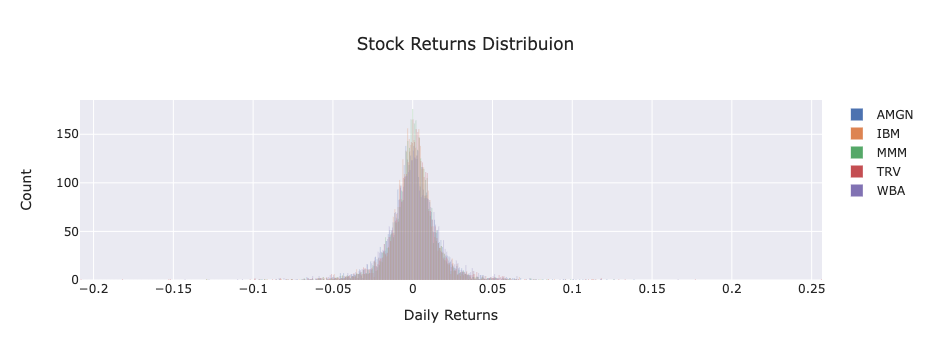

In [5]:
# Plot the histogram of the each stocks returns
fig = go.Figure()

for stock, col in enumerate(stock_returns.columns.tolist()):
    fig.add_trace(
    go.Histogram(
        x=stock_returns[col],
        name=stocks[stock]
    ))


fig.update_layout(
    title={
        'text': "Stock Returns Distribuion",
    },
    template=theme,
    xaxis=dict(autorange=True,
              title_text='Daily Returns'),
    yaxis=dict(autorange=True,
              title_text='Count')
)

fig.show()

### 2. Cumulative Stock Returns

In [6]:
# Calculate stocks cumulative returns
cumulative_returns = (1 + stock_returns).cumprod()

init_date = cumulative_returns.index[0] - timedelta(days=1)
cumulative_returns.loc[init_date] = 1
cumulative_returns = cumulative_returns.sort_index()

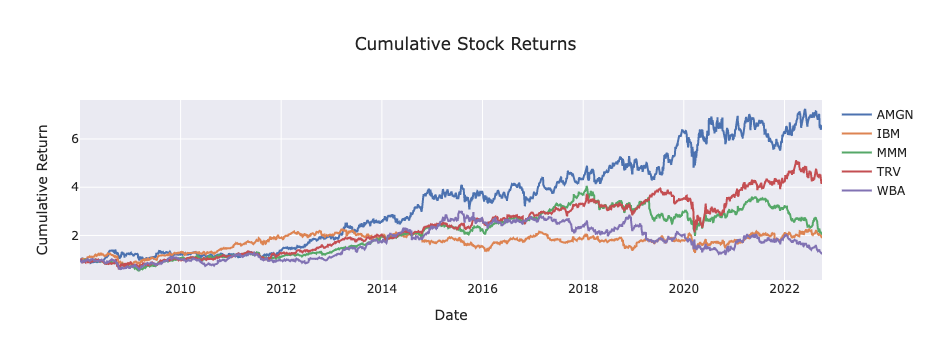

In [7]:
# Plot the stocks cumulative returns
fig = go.Figure()

for stock, col in enumerate(cumulative_returns.columns.tolist()):
    fig.add_trace(
    go.Scatter(
        x=cumulative_returns.index,
        y=cumulative_returns[col],
        name=stocks[stock]
    ))


fig.update_layout(
    title={
        'text': "Cumulative Stock Returns",
    },
    template=theme,
    xaxis=dict(autorange=True,
              title_text='Date'),
    yaxis=dict(autorange=True,
              title_text='Cumulative Return')
)

fig.show()

## Optimal Weights 

### 1. Covariance Matrix

In [8]:
# Calculate Covariance matrix of the log stock returns. We use log as it produces marginally more accurate results.
cov_matrix = df.pct_change().apply(lambda x: np.log(1+x)).cov() 
cov_matrix

Symbols,AMGN,IBM,MMM,TRV,WBA
Symbols,,,,,
AMGN,0.000279,0.000099,0.000111,0.000124,0.000120
IBM,0.000099,0.000230,0.000129,0.000140,0.000122
MMM,0.000111,0.000129,0.000225,0.000149,0.000128
TRV,0.000124,0.000140,0.000149,0.000334,0.000131
WBA,0.000120,0.000122,0.000128,0.000131,0.000343


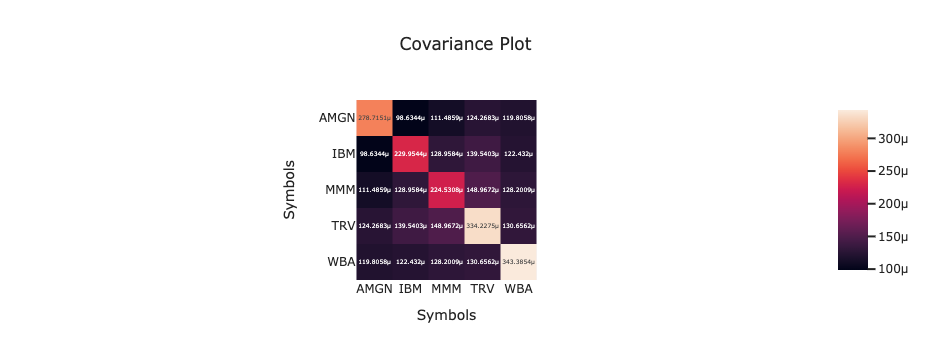

In [9]:
# Covariance matrix heatmap
fig = px.imshow(cov_matrix,text_auto=True, title='Covariance Plot', template=theme)
fig.show()

### 2. Correlation Matrix

In [10]:
# Calculate Correlation matrix of the log stock returns. We use log as it produces marginally more accurate results.
corr_matrix = df.pct_change().apply(lambda x: np.log(1+x)).corr() #read up and explain
corr_matrix

Symbols,AMGN,IBM,MMM,TRV,WBA
Symbols,,,,,
AMGN,1.000000,0.389608,0.445658,0.407154,0.387263
IBM,0.389608,1.000000,0.567533,0.503336,0.435696
MMM,0.445658,0.567533,1.000000,0.543790,0.461703
TRV,0.407154,0.503336,0.543790,1.000000,0.385672
WBA,0.387263,0.435696,0.461703,0.385672,1.000000


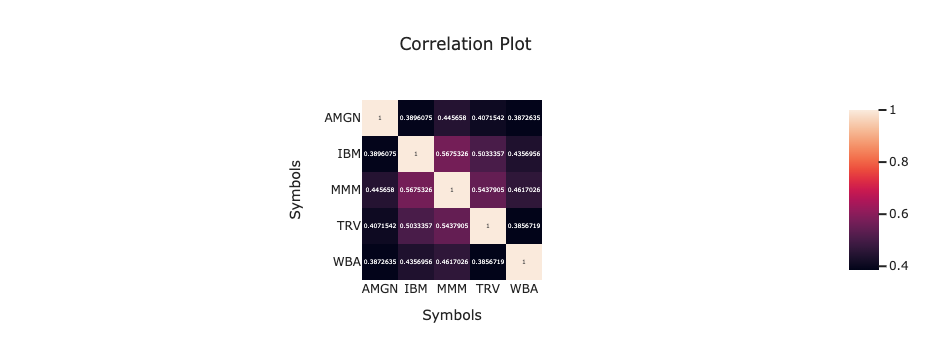

In [11]:
# Correlation matrix heatmap
fig = px.imshow(corr_matrix,text_auto=True, title='Correlation Plot', template=theme)
fig.show()

### 3. Annual Returns

In [12]:
# CAGR for individual companies
dt = pd.to_datetime(start_date, format='%Y/%m/%d')
dt1 = pd.to_datetime(end_date, format='%Y/%m/%d')

yrs_full = ((dt1-dt).days)/365
%store yrs_full

annual_returns = df.pct_change().apply(lambda x: (1+x)).cumprod().iloc[-1]**(1/yrs_full) - 1
annual_returns

Stored 'yrs_full' (float)


Symbols
AMGN    0.134155
IBM     0.044303
MMM     0.049094
TRV     0.102436
WBA     0.013135
Name: 2022-09-30 00:00:00, dtype: float64

### 4. Annual Standard Deviation

In [13]:
# Volatility is given by the annual standard deviation. We multiply by 252 because there are 252 trading days/year. Also
# We will use the log of the stock returns in our calculation as it produces mrginally more accurate results.
annual_std_dev = df.pct_change().apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(252))
annual_std_dev

Symbols
AMGN    0.265021
IBM     0.240725
MMM     0.237869
TRV     0.290216
WBA     0.294165
dtype: float64

### 5. Returns_Volatility Table

In [14]:
# Concatenate the annual returns and standard deviation dataframes
risk_return = pd.concat([annual_returns, annual_std_dev], axis=1) # Creating a table for visualising returns and volatility of assets
risk_return.columns = ['Returns', 'Volatility']
risk_return

,Returns,Volatility
Symbols,,
AMGN,0.134155,0.265021
IBM,0.044303,0.240725
MMM,0.049094,0.237869
TRV,0.102436,0.290216
WBA,0.013135,0.294165


### 6. Optimal Weights Calculation

In [15]:
# Setup lists to hold portfolio weights, returns and volatility
p_ret = [] # Define an empty array for portfolio returns
p_vol = [] # Define an empty array for portfolio volatility
p_weights = [] # Define an empty array for asset weights

num_assets = len(stocks)
num_portfolios = number_opt_porfolios

In [16]:
# Calculate Portfolio weights for num_portfolios
for portfolio in range(num_portfolios):
    weights = np.random.random(num_assets)
    weights = weights/np.sum(weights)
    p_weights.append(weights)
    returns = np.dot(weights, annual_returns) # Returns are the product of individual expected returns of asset and its 
                                      # weights 
    p_ret.append(returns)
    var = cov_matrix.mul(weights, axis=0).mul(weights, axis=1).sum().sum()# Portfolio Variance
    sd = np.sqrt(var) # Daily standard deviation
    ann_sd = sd*np.sqrt(252) # Annual standard deviation = volatility
    p_vol.append(ann_sd)

In [17]:
# Insert the stock weights that correspon to the respective portfolio return and volatility
data = {'Returns':p_ret, 'Volatility':p_vol}

#for counter, symbol in enumerate(df.columns.tolist()):
for counter, symbol in enumerate(stocks):
    data[symbol+' weight'] = [w[counter] for w in p_weights]

In [18]:
# Create portfolios dataframe to hold the portfolio weights of stocks, and portfolio return, volatility and sharpe ratio
portfolios  = pd.DataFrame(data)

portfolios['Sharpe'] = (portfolios['Returns']-rf)/portfolios['Volatility']

portfolios.head() # Dataframe of the 10000 portfolios created

,Returns,Volatility,AMGN weight,IBM weight,MMM weight,TRV weight,WBA weight,Sharpe
0,0.068165,0.200026,0.133197,0.338101,0.260318,0.212900,0.055485,0.290789
1,0.057294,0.210826,0.065285,0.024308,0.362501,0.251571,0.296334,0.224328
2,0.049948,0.204864,0.009284,0.437468,0.375464,0.095773,0.082010,0.194995
3,0.064485,0.202067,0.105673,0.175297,0.302353,0.248877,0.167800,0.269637
4,0.078312,0.203755,0.327909,0.074759,0.156568,0.196343,0.244421,0.335266


In [19]:
# Plot efficient frontier

# px.scatter(portfolios, x='Volatility', y='Returns', color='Sharpe', title='Portfolio Efficient Frontier',
#            marginal_y='box')

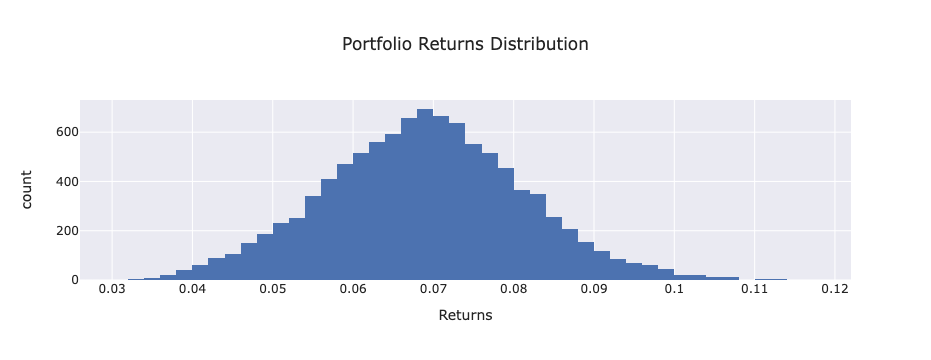

In [20]:
# Plot Portfolio Return Distribution
px.histogram(portfolios, x='Returns', nbins=50, title='Portfolio Returns Distribution', template=theme)

In [21]:
# Finding the optimal portfolio
optimal_risky_port = portfolios.iloc[(portfolios['Sharpe']).idxmax()]
%store optimal_risky_port
optimal_risky_port

Stored 'optimal_risky_port' (Series)


Returns        0.120444
Volatility     0.234096
AMGN weight    0.763037
IBM weight     0.013672
MMM weight     0.057799
TRV weight     0.139549
WBA weight     0.025942
Sharpe         0.471790
Name: 7050, dtype: float64

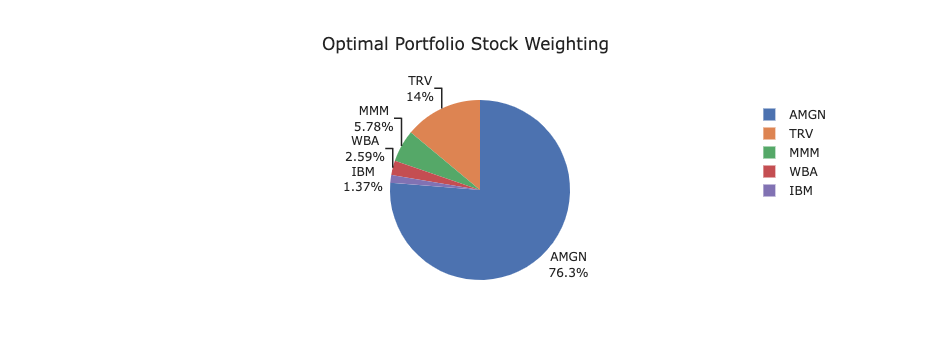

In [22]:
# Pie Chart of optimal portfolio stock weightings
opt_port_df = pd.DataFrame(data={'Stocks': df.columns.tolist(), 'Weight': optimal_risky_port[2:-1].values})

fig = px.pie(opt_port_df, values='Weight', names='Stocks',
             title='Optimal Portfolio Stock Weighting',
             template=theme
            )
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.show()

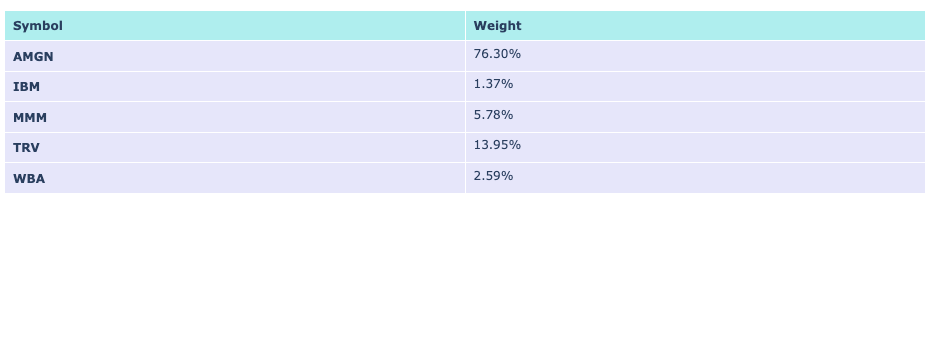

In [23]:
# Optimal Portfolio Stock Weights Table
head = ['<b>Symbol<b>', '<b>Weight<b>']

labels =[]

for stock in opt_port_df['Stocks'].tolist():
    txt='<b>'+stock+'<b>'
    labels.append(txt)
    
wght =[]
    
for weight in opt_port_df['Weight'].tolist():
    w = '{:.2%}'.format(weight)
    wght.append(w)

    
fig = go.Figure(data=[go.Table(
    header=dict(values=head,
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[labels, wght],
               fill_color='lavender',
               align='left'))
])

fig.update_layout(margin=dict(l=5, r=5, b=0,t=10))

fig.show()

In [24]:
# create an optimal portfolio dataframe
optimal_port_df = pd.DataFrame(data={'Returns': optimal_risky_port[0], 'Volatility': optimal_risky_port[1]}, index=[0])
#optimal_port_df

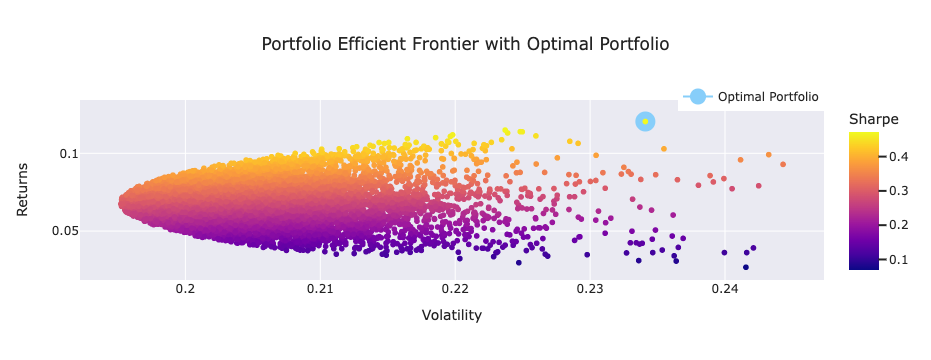

In [25]:
# Plot efficient frontier with optimal portfolio
fig = px.scatter(portfolios, x='Volatility', y='Returns', color='Sharpe', title='Portfolio Efficient Frontier with Optimal Portfolio')
fig.add_trace(go.Scatter(x=optimal_port_df['Volatility'], y=optimal_port_df['Returns'], name='Optimal Portfolio',
            marker=dict(
            color='LightSkyBlue',
            size=20,
            )))

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="top",
    y=1.1,
    xanchor="right",
    x=1
    ),
    template=theme
)
fig.show()

## Calculate Historical Optimal Portfolio Return using Optimal Weights

### 1. Historical Daily Returns for the Optimal Portfolio

In [26]:
weights = optimal_risky_port[2:-1].values

weights_full = weights
%store weights_full

portfolio_returns = stock_returns.dot(weights)

# Display sample data
portfolio_returns.sample(10)

Stored 'weights_full' (ndarray)


Date
2019-07-18    0.011227
2009-11-09    0.009599
2012-05-21    0.003865
2012-09-10   -0.000059
2010-05-06   -0.029858
2014-09-26    0.007563
2017-12-05   -0.001992
2021-05-10   -0.002471
2013-04-01   -0.002690
2013-04-09   -0.004462
dtype: float64

In [27]:
# Convert the historical optimal portfolio returns to a dataframe
port_returns = pd.DataFrame(portfolio_returns)
port_returns.columns = ['Portfolio_returns']
display(port_returns)
%store port_returns

,Portfolio_returns
Date,
2008-01-03,-0.014598
2008-01-04,-0.020974
2008-01-07,0.011799
2008-01-08,0.009940
2008-01-09,0.023343
...,...
2022-09-26,-0.004900
2022-09-27,-0.002905
2022-09-28,0.020090


Stored 'port_returns' (DataFrame)


### 2. Historical Cumulative Returns for the Optimal Portfolio

In [28]:
# Calculate the historical cumulative returns for the optimal portfolio
optimal_cumulative_returns = (1 + port_returns).cumprod()

init_date = optimal_cumulative_returns.index[0] - timedelta(days=1)
optimal_cumulative_returns.loc[init_date] = 1
optimal_cumulative_returns = optimal_cumulative_returns.sort_index()
display(optimal_cumulative_returns)
%store optimal_cumulative_returns

,Portfolio_returns
Date,
2008-01-02,1.000000
2008-01-03,0.985402
2008-01-04,0.964734
2008-01-07,0.976116
2008-01-08,0.985819
...,...
2022-09-26,6.062005
2022-09-27,6.044395
2022-09-28,6.165829


Stored 'optimal_cumulative_returns' (DataFrame)
